In [132]:
import numpy as np
from data_process import get_FASHION_data
from scipy.spatial import distance

from softmax import Softmax
import xgboost as xgb
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, LogisticRegression, LogisticRegressionCV
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, mean_squared_error
from sklearn.preprocessing import OrdinalEncoder, StandardScaler

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import itertools
from mlxtend.plotting import plot_decision_regions
%matplotlib inline

# For auto-reloading external modules
# See http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# DATA LOADER && ANALYSIS

### Loading Fashion-MNIST
TRAIN_IMAGES + VAL_IMAGES = (0, 60000], TEST_IMAGES = 10000

In [2]:
TRAIN_IMAGES = 60000
VAL_IMAGES = 0
normalize = True

data = get_FASHION_data(TRAIN_IMAGES, VAL_IMAGES, normalize=normalize)
X_train, y_train = data['X_train'], data['y_train']
X_val, y_val = data['X_val'], data['y_val']
X_test, y_test = data['X_test'], data['y_test']
n_class_fashion = len(np.unique(y_test))

### frequency table

In [3]:
train_dat = np.array(np.unique(y_train, return_counts=True)).T
test_dat = np.array(np.unique(y_test, return_counts=True)).T
print("|--------------------------------|")
print("| training set  ||  testing set  |")
print("|===============||===============|")
print("| class | count || class | count |")
print("|-------|-------||-------|-------|")
for cls1, count1, cls2, count2 in np.concatenate((train_dat, test_dat), axis=1):
    print("|  %2d   | %5d ||  %2d   | %5d |" % (cls1, count1, cls2, count2))
print("|--------------------------------|")

|--------------------------------|
| training set  ||  testing set  |
|===============||===============|
| class | count || class | count |
|-------|-------||-------|-------|
|   0   |  6000 ||   0   |  1000 |
|   1   |  6000 ||   1   |  1000 |
|   2   |  6000 ||   2   |  1000 |
|   3   |  6000 ||   3   |  1000 |
|   4   |  6000 ||   4   |  1000 |
|   5   |  6000 ||   5   |  1000 |
|   6   |  6000 ||   6   |  1000 |
|   7   |  6000 ||   7   |  1000 |
|   8   |  6000 ||   8   |  1000 |
|   9   |  6000 ||   9   |  1000 |
|--------------------------------|


### t-SNE

C:\Users\anna8\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\anna8\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


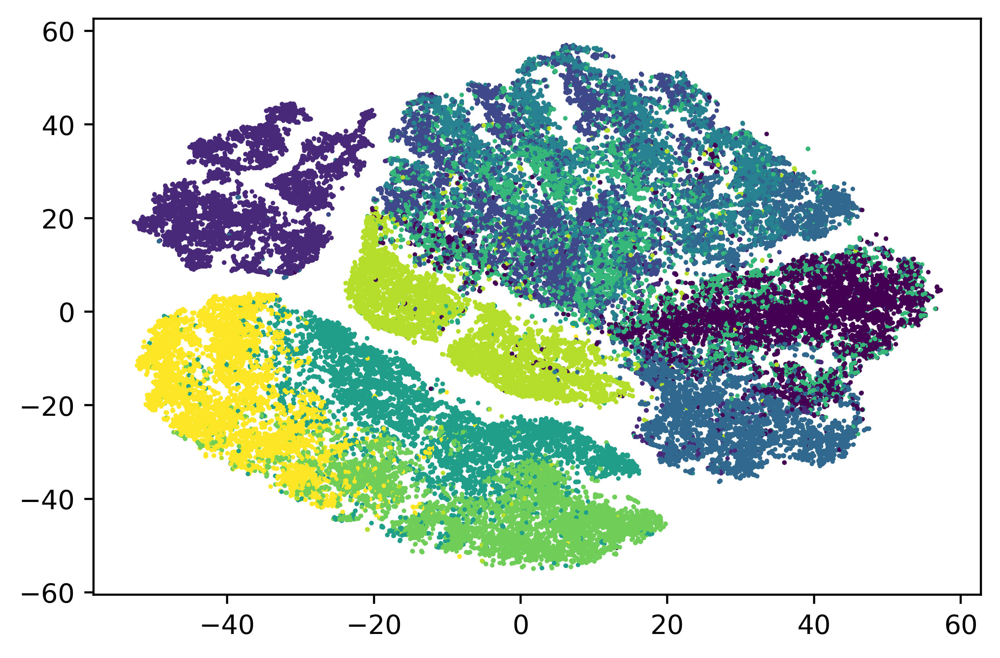

In [27]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, n_jobs=-1)
train_set_2D = tsne.fit_transform(X_train)
plt.figure(dpi=500)
plt.scatter(train_set_2D[:, 0], train_set_2D[:, 1], c=y_train, s=0.5)

C:\Users\anna8\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\anna8\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


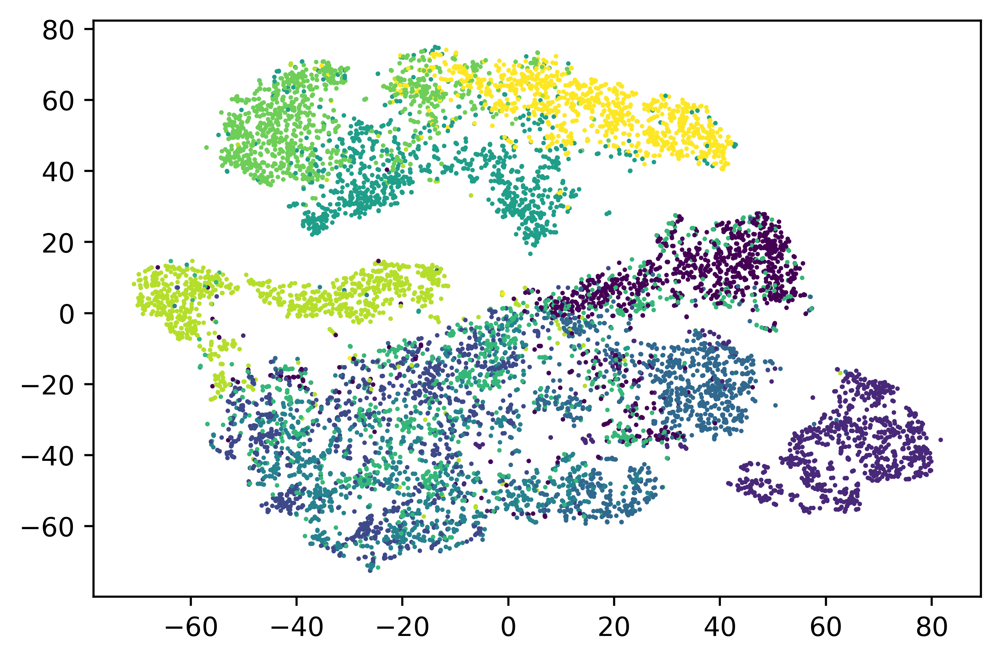

In [28]:
tsne = TSNE(n_components=2, n_jobs=-1)
test_set_2D = tsne.fit_transform(X_test)
plt.figure(dpi=500)
plt.scatter(test_set_2D[:, 0], test_set_2D[:, 1], c=y_test, s=0.5)

# 3. CLUSTER MODELS

## 3.1 K-Means

### Data input & preprocessing

In [14]:
#if you want to do the kmeans, run this chunk to load the data
#Ow, just use the previous data loading code
import keras
from keras.datasets import fashion_mnist 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans 

import plotly as py
import plotly.graph_objs as go
import plotly.express as px

(X_train,y_train), (X_test,y_test) = fashion_mnist.load_data()

#Reshapeing X to a 2D array
X = X_train.reshape(-1,X_train.shape[1]*X_train.shape[2])
y = y_train

### PCA

In [ ]:
#create function to center data
center_function = lambda x: x - x.mean()

#apply function to original NumPy array
data_centered = center_function(X)

#PCA
# Clus_dataSet = StandardScaler().fit_transform(X) #(mean = 0 and variance = 1)

from sklearn.decomposition import PCA
# Make an instance of the Model
variance = 0.98
pca = PCA(n_components= variance)

# pca.fit(Clus_dataSet)
pca.fit(data_centered)


Clus_dataSet = pca.transform(data_centered)
# Clus_dataSet = pca.transform(Clus_dataSet)

### K-Means

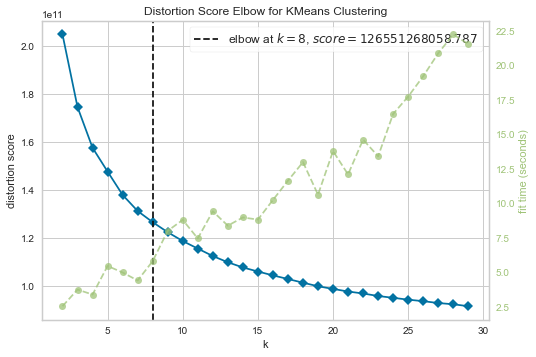

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [15]:
# Elbow Method for K means
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(Clus_dataSet)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

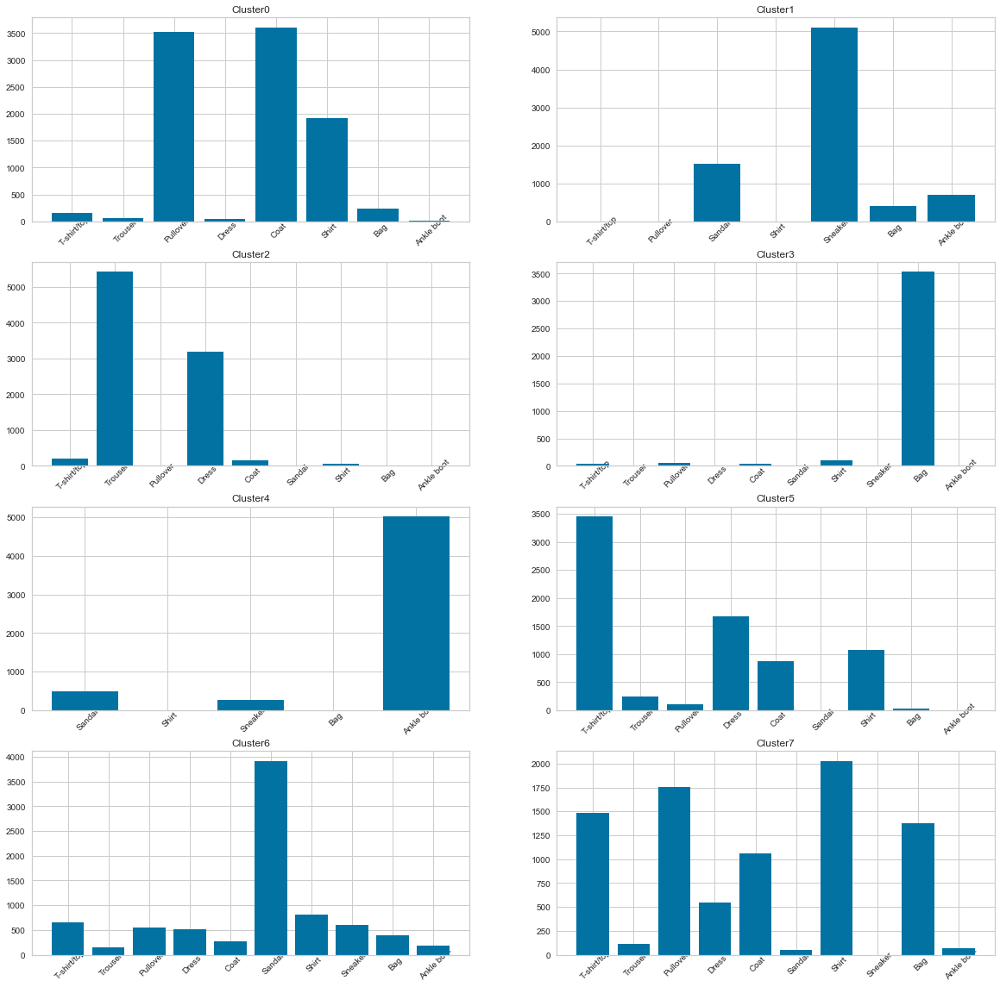

In [21]:
k_means = KMeans(init = "k-means++", n_clusters = 8, n_init = 35)

k_means.fit(Clus_dataSet)

k_means_labels = k_means.labels_

G = len(np.unique(k_means_labels)) #Number of labels


#Hitech 2D matrix  for an array of indexes of the given label
cluster_index= [[] for i in range(G)]
for i, label in enumerate(k_means_labels,0):
    for n in range(G):
        if label == n:
            cluster_index[n].append(i)
        else:
            continue

Y_clust = [[] for i in range(G)]
for n in range(G):
    Y_clust[n]=y[cluster_index[n]] #Y_clust[0] contains array of answers for the cluster_index[0]
    assert(len(Y_clust[n])==len(cluster_index[n]))

#counts the number of each category in each cluster
def counter(cluster):
    unique, counts = np.unique(cluster, return_counts=True)
    label_index = dict(zip(unique, counts))
    return label_index

label_count= [[] for i in range(G)]
for n in range(G):
    label_count[n] = counter(Y_clust[n])

class_names = {0:'T-shirt/top', 1:'Trouser',2: 'Pullover',3: 'Dress',4: 'Coat',5:
               'Sandal',6: 'Shirt', 7:'Sneaker',8:  'Bag',9: 'Ankle boot'}

def plotter(label_dict):
    plt.bar(range(len(label_dict)), list(label_dict.values()), align='center')
    a = []
    for i in [*label_dict]: a.append(class_names[i])
    plt.xticks(range(len(label_dict)), list(a), rotation=45, rotation_mode='anchor')

plt.figure(figsize=(20,20))
for i in range (1,9):
    plt.subplot(4, 2, i)
    plotter(label_count[i-1]) 
    plt.title("Cluster" + str(i-1))

In [ ]:
#3D Plotly Visualisation of Clusters using go

layout = go.Layout(
    title='<b>Cluster Visualisation</b>',
    yaxis=dict(
        title='<i>Y</i>'
    ),
    xaxis=dict(
        title='<i>X</i>'
    )
)

colors = ['red','green' ,'blue','purple','magenta','yellow','cyan','maroon','teal','black']
trace = [ go.Scatter3d() for _ in range(11)]
for i in range(0,10):
    my_members = (k_means_labels == i)
    index = [h for h, g in enumerate(my_members) if g]
    trace[i] = go.Scatter3d(
            x=Clus_dataSet[my_members, 0],
            y=Clus_dataSet[my_members, 1],
            z=Clus_dataSet[my_members, 2],
            mode='markers',
            marker = dict(size = 2,color = colors[i]),
            hovertext=index,
            name='Cluster'+str(i),
    #             line=dict(shape='spline')
            )

    #data.append(trace1)
fig = go.Figure(data=[trace[0],trace[1],trace[2],trace[3],trace[4],trace[5],trace[6],trace[7],trace[8],trace[9]], layout=layout)
    
py.offline.iplot(fig)

## 3.2 Self-organizing Maps (using R)

# 4. CLASSIFICATION MODELS

## 4.1 KNN

### KNN

In [138]:
knn_best = None
knn_best_pred = None
knn_best_acc = 0
knn_acc_lst = np.zeros(20)

for i in range(1, 10):
    knn = KNeighborsClassifier(n_neighbors=i, n_jobs=-1)
    knn.fit(X_train, y_train)
    knn_y_test_pred = knn.predict(X_test)
    knn_acc = accuracy_score(y_test, knn_y_test_pred)
    knn_acc_lst[i-1] = knn_acc
    if knn_acc > knn_best_acc:
        knn_best_acc = knn_acc
        knn_best = knn
        knn_best_k = i
        knn_best_pred = knn_y_test_pred
    print(f"{i}: {knn_acc:.4f}")
# ConfusionMatrixDisplay.from_predictions(y_test, knn_best_pred)

1: 0.8497
2: 0.8460
3: 0.8541
4: 0.8577
5: 0.8554
6: 0.8544
7: 0.8540
8: 0.8534
9: 0.8519


best k: 4, train: 0.9082, test: 0.8519


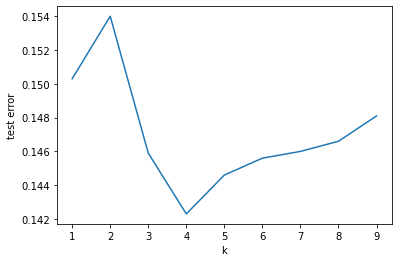

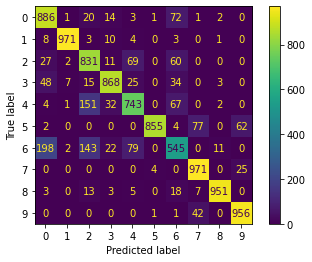

In [139]:
plt.plot(list(range(1, np.nonzero(knn_acc_lst)[0].shape[0]+1)), 1 - knn_acc_lst[np.nonzero(knn_acc_lst)])
plt.xlabel("k")
plt.ylabel("test error")

knn_y_train_pred = knn_best.predict(X_train)
print(f"best k: {knn_best_k}, train: {accuracy_score(y_train, knn_y_train_pred):.4f}, test: {accuracy_score(y_test, knn_y_test_pred):.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, knn_best_pred)

### PCA + KNN

### PCA

In [20]:
#create function to center data
center_function = lambda x: x - x.mean()

#apply function to original NumPy array
train_centered = center_function(X_train)
test_centered = center_function(X_test)
#PCA
# Clus_dataSet = StandardScaler().fit_transform(X) #(mean = 0 and variance = 1)

from sklearn.decomposition import PCA
# Make an instance of the Model
variance = 0.98
pca = PCA(n_components= variance)

pca.fit(train_centered)
X_train_pca = pca.transform(train_centered)
X_test_pca = pca.transform(test_centered)


### KNN

In [24]:
X_train.shape

(60000, 784)

In [17]:
knn1_best_acc = 0
knn1_acc_lst = np.zeros(20)

for i in range(1, 10):
    knn1 = KNeighborsClassifier(n_neighbors=i, n_jobs=-1)
    knn1.fit(X_train_pca, y_train)
    knn1_y_test_pred = knn1.predict(X_test_pca)
    knn1_test_acc = accuracy_score(y_test, knn1_y_test_pred)
    knn1_acc_lst[i] = knn1_test_acc
    print(f"{i} test: {knn1_test_acc:.4f}")

1 test: 0.8529
2 test: 0.8495
3 test: 0.8597
4 test: 0.8612
5 test: 0.8589
6 test: 0.8597
7 test: 0.8572
8 test: 0.8581
9 test: 0.8552


Text(0, 0.5, 'test error')

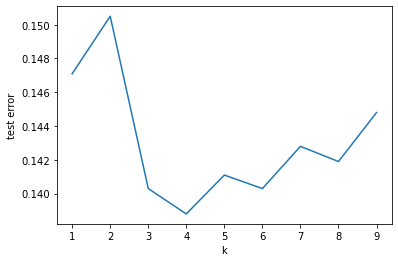

In [9]:
plt.plot(list(range(1, np.nonzero(knn1_acc_lst)[0].shape[0]+1)), 1 - knn1_acc_lst[np.nonzero(knn1_acc_lst)])
plt.xlabel("k")
plt.ylabel("test error")

### use k=4 with PCA(Final model)

train: 0.9116, test: 0.8612


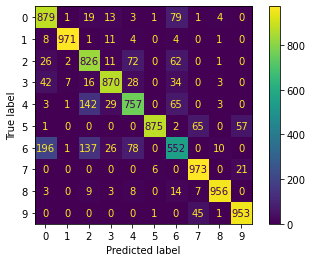

In [71]:
knn1 = KNeighborsClassifier(n_neighbors=4, n_jobs=-1)
knn1.fit(X_train_pca, y_train)
knn1_y_train_pred = knn1.predict(X_train_pca)
knn1_y_test_pred = knn1.predict(X_test_pca)
knn1_train_acc = accuracy_score(y_train, knn1_y_train_pred)
knn1_test_acc = accuracy_score(y_test, knn1_y_test_pred)
print(f"train: {knn1_train_acc:.4f}, test: {knn1_test_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, knn1_y_test_pred)

## *Adaboost

In [ ]:
# ab = AdaBoostClassifier(n_estimators=500, learning_rate=0.01)
# ab.fit(X_train, y_train)
# ab_y_test_pred = ab.predict(X_test)
# ab_acc = accuracy_score(y_test, ab_y_test_pred)
# print(f"test accuracy: {ab_acc:.4f}")

test accuracy: 0.5060


[[ 18   0   0 619   1   0 340   0  22   0]
 [  1   5   0 956   0   0  35   0   3   0]
 [  0   0   5  13  67   0 892   0  23   0]
 [  0   0   0 854   2   0 140   0   4   0]
 [  6   0   0  79 286   0 612   0  17   0]
 [  0   0   0   0   0 869   1   0 108  22]
 [ 16   0   1 204 112   0 633   0  34   0]
 [  0   0   0   0   0 952   0   0  34  14]
 [  0   0   0   6   3   4  91   0 896   0]
 [  0   0   0   0   0 370   0   0  16 614]]
[0.018 0.005 0.005 0.854 0.286 0.869 0.633 0.    0.896 0.614]


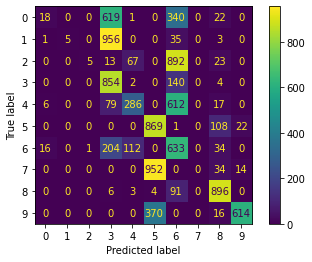

In [ ]:
# ab_matrix = confusion_matrix(y_test, ab_y_test_pred)
# print(ab_matrix)
# print(ab_matrix.diagonal()/ab_matrix.sum(axis=1))

# ConfusionMatrixDisplay.from_predictions(y_test, ab_y_test_pred)

## 4.2 Gradient Boost

### sklearn.GradientBoostingClassifier

In [141]:
gb = GradientBoostingClassifier(n_estimators=500, learning_rate=0.1)
gb.fit(X_train, y_train)
gb_y_test_pred = gb.predict(X_test)
gb_acc = accuracy_score(y_test, gb_y_test_pred)
print(f"test accuracy: {gb_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, gb_y_test_pred)

KeyboardInterrupt: 

### XGBoost.XGBClassifier

train: 1.0000, test: 0.9028


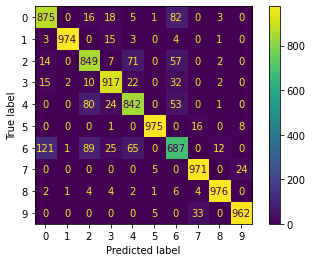

In [89]:
# use multi:softmax: set XGBoost to do multiclass classification using the softmax objective
dat = xgb.DMatrix(X_train, y_train)
xg = xgb.XGBClassifier(n_estimators=500, learning_rate=0.1, verbosity=1, n_jobs=-1,objective="multi:softmax",
num_class = 10)
xg.fit(X_train, y_train)

xg_y_train_pred = xg.predict(X_train)
xg_y_test_pred = xg.predict(X_test)
xg_train_acc = accuracy_score(y_train, xg_y_train_pred)
xg_test_acc = accuracy_score(y_test, xg_y_test_pred)
print(f"train: {xg_train_acc:.4f}, test: {xg_test_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, xg_y_test_pred)

## 4.3 Random forest

In [81]:
# Tune # of trees
for i in range(100,1000,100):
    rf = RandomForestClassifier(n_estimators=i, n_jobs=-1)
    rf.fit(X_train, y_train)
    rf_y_test_pred = rf.predict(X_test)
    rf_y_train_pred = rf.predict(X_train)
    rf_acc = accuracy_score(y_test, rf_y_test_pred)
    print(f"{i} train: {accuracy_score(y_train, rf_y_train_pred):.4f}, test: {rf_acc:.4f}")

100 train: 1.0000, test: 0.8791
200 train: 1.0000, test: 0.8796
300 train: 1.0000, test: 0.8791
400 train: 1.0000, test: 0.8788
500 train: 1.0000, test: 0.8775
600 train: 1.0000, test: 0.8778
700 train: 1.0000, test: 0.8792
800 train: 1.0000, test: 0.8798
900 train: 1.0000, test: 0.8800


### use trees=900 without PCA(Final model)

train: 1.0000, test: 0.8795


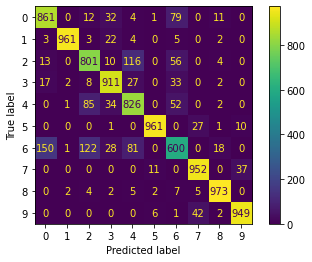

In [86]:
rf = RandomForestClassifier(n_estimators=900, n_jobs=-1)
rf.fit(X_train, y_train)
rf_y_test_pred = rf.predict(X_test)
rf_y_train_pred = rf.predict(X_train)
rf_acc = accuracy_score(y_test, rf_y_test_pred)
print(f"train: {accuracy_score(y_train, rf_y_train_pred):.4f}, test: {rf_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, rf_y_test_pred)

## 4.4 SVM

#### Tune parameter C without PCA

In [69]:
for i in (1, 5, 10, 15, 20, 25):
    rbf = SVC(kernel='rbf',C=i)
    rbf.fit(X_train, y_train)
    rbf_y_test_pred = rbf.predict(X_test)
    rbf_y_train_pred = rbf.predict(X_train)
    rbf_acc = accuracy_score(y_test, rbf_y_test_pred)
    print(f"{i}train: {accuracy_score(y_train, rbf_y_train_pred):.4f}, test: {rbf_acc:.4f}")


1train: 0.9245, test: 0.8879
5train: 0.9698, test: 0.9013
10train: 0.9854, test: 0.9027
15train: 0.9915, test: 0.9028
20train: 0.9948, test: 0.9031
25train: 0.9968, test: 0.9020


(1, 5, 76, 8)

train: 0.9948, test: 0.9031


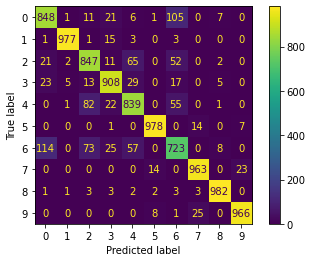

In [70]:
rbf = SVC(kernel='rbf',C=20)
rbf.fit(X_train, y_train)
rbf_y_test_pred = rbf.predict(X_test)
rbf_y_train_pred = rbf.predict(X_train)
rbf_acc = accuracy_score(y_test, rbf_y_test_pred)
print(f"train: {accuracy_score(y_train, rbf_y_train_pred):.4f}, test: {rbf_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, rbf_y_test_pred)

#### Tune parameter C without PCA

In [74]:
# tune C in PCA&SVM
for i in (1, 5, 10, 15, 20, 25):
    rbf = SVC(kernel='rbf',C=i)
    rbf.fit(X_train_pca, y_train)
    rbf_y_test_pred = rbf.predict(X_test_pca)
    rbf_y_train_pred = rbf.predict(X_train_pca)
    rbf_acc = accuracy_score(y_test, rbf_y_test_pred)
    print(f"{i}train: {accuracy_score(y_train, rbf_y_train_pred):.4f}, test: {rbf_acc:.4f}")

1train: 0.9216, test: 0.8873
5train: 0.9633, test: 0.9023
10train: 0.9796, test: 0.9059
15train: 0.9873, test: 0.9046
20train: 0.9915, test: 0.9056
25train: 0.9940, test: 0.9057


#### Use C = 10 with PCA(Final model)

train: 0.9796, test: 0.9059


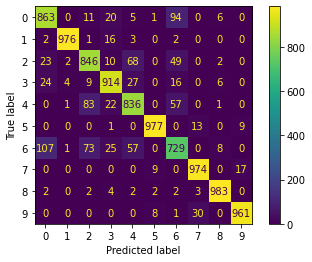

In [82]:
# use PCA & SVM
rbf = SVC(kernel='rbf',C=10)
rbf.fit(X_train_pca, y_train)
rbf_y_test_pred = rbf.predict(X_test_pca)
rbf_y_train_pred = rbf.predict(X_train_pca)
rbf_acc = accuracy_score(y_test, rbf_y_test_pred)
print(f"train: {accuracy_score(y_train, rbf_y_train_pred):.4f}, test: {rbf_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, rbf_y_test_pred)

In [51]:
n_features = X_train.shape[1]
gamma = 1 / (n_features * X_train.var())

In [62]:
C_range = np.logspace(-2, 10, 13)

## 4.5 EXTENTION: Logistic Regression -> Softmax Classifier (with SGD)

- lr, epoch, regularization constant

### code from scratch

train: 0.8459, test: 0.8274


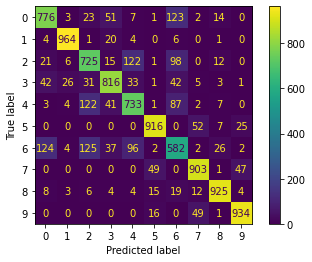

In [136]:
# Train
lr = 0.5
n_epochs = 2000
reg_const = 1
batch_num = 50

sm = Softmax(n_class_fashion, lr, n_epochs, reg_const, batch_num)
sm.train(X_train, y_train)

sm_y_train_pred = sm.predict(X_train)
sm_y_test_pred = sm.predict(X_test)

print(f'train: {accuracy_score(y_train, sm_y_train_pred):.4f}, test: {accuracy_score(y_test, sm_y_test_pred):.4f}')
ConfusionMatrixDisplay.from_predictions(y_test, sm_y_test_pred)

### sklean.LogisticRegression

In [ ]:
lr = LogisticRegression(max_iter=5000)
lr.fit(X_train, y_train)
lr_y_test_pred = lr.predict(X_test)

train: train: 0.8837, test: 0.8330


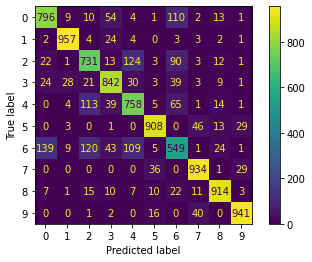

In [17]:
lr_y_train_pred = lr.predict(X_train)
lr_acc = accuracy_score(y_test, lr_y_test_pred)
print(f"train: train: {accuracy_score(y_train, lr_y_train_pred):.4f}, test: {lr_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test, lr_y_test_pred)

# 5. ENSEMBLE

- input: PCA_KNN + RandomForest + XGBoost + PCA_SVM
- model: KNN
- output: final_pred

In [111]:
input_cat = np.array((knn1_y_test_pred, rf_y_test_pred, xg_y_test_pred, rbf_y_test_pred)).T
# enc = OrdinalEncoder()
# enc.fit(input)
# input_cat = enc.transform(input)

In [112]:
input_cat

array([[9, 9, 9, 9],
       [2, 2, 2, 2],
       [1, 1, 1, 1],
       ...,
       [8, 8, 8, 8],
       [1, 1, 1, 1],
       [5, 5, 5, 5]])

### Stage 2: Knn

In [113]:
en_best_acc = 0
en_acc_lst = np.zeros(20)

for i in range(1, 20):
    en = KNeighborsClassifier(n_neighbors=i, n_jobs=-1)
    en.fit(input_cat[:8000], y_test[:8000])
    test_hat = en.predict(input_cat[8000:])
    en_acc = accuracy_score(y_test[8000:], test_hat)
    en_acc_lst[i] = en_acc

    print(f"{i}: {en_acc:.4f}")


1: 0.8855
2: 0.8875
3: 0.8925
4: 0.8985
5: 0.8965
6: 0.8980
7: 0.8980
8: 0.8965
9: 0.8945
10: 0.8955
11: 0.8950
12: 0.8960
13: 0.8965
14: 0.8955
15: 0.8955
16: 0.8945
17: 0.8935
18: 0.8920
19: 0.8920


In [116]:
best_k = np.argmax(en_acc_lst)
best_k

4

Text(0, 0.5, 'test error')

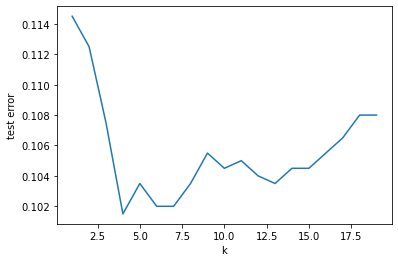

In [115]:
plt.plot(list(range(1, np.nonzero(en_acc_lst)[0].shape[0]+1)), 1 - en_acc_lst[np.nonzero(en_acc_lst)])
plt.xlabel("k")
plt.ylabel("test error")

In [134]:
en = KNeighborsClassifier(n_neighbors=best_k, n_jobs=-1)

# use first 8000 to train([:8000]), last 2000 to test([8000:])
en.fit(input_cat[:8000], y_test[:8000]) 

train_hat = en.predict(input_cat[:8000])
test_hat = en.predict(input_cat[8000:])
en_acc = accuracy_score(y_test[8000:], test_hat)

train: 0.9084, test: 0.8985


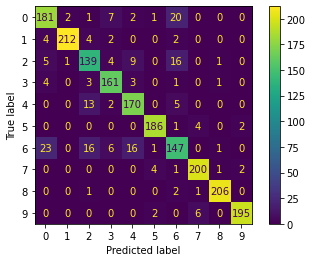

In [135]:
print(f"train: {accuracy_score(y_test[:8000], train_hat):.4f}, test: {en_acc:.4f}")
ConfusionMatrixDisplay.from_predictions(y_test[8000:], test_hat)

### Stage 2: Hard Voting

In [120]:
# group / ensemble of models
estimator = [('Knn',knn1),('XGBoost',xg),('RF',rf),('SVM',rbf)]
# Voting Classifier with hard voting
vot_hard = VotingClassifier(estimators = estimator, voting ='hard')
vot_hard.fit(input_cat[:8000], y_test[:8000])
y_test_vot_pred = vot_hard.predict(input_cat[8000:])
y_train_vot_pred = vot_hard.predict(input_cat[:8000])
en_train_vot_acc = accuracy_score(y_test[:8000], y_train_vot_pred)
en_test_vot_acc = accuracy_score(y_test[8000:], y_test_vot_pred)
print(f"train: {en_train_vot_acc:.4f}, test: {en_test_vot_acc:.4f}")


train: 0.9201, test: 0.8975


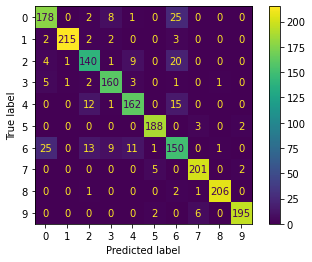

In [123]:
ConfusionMatrixDisplay.from_predictions(y_test[8000:], y_test_vot_pred)